In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pylab as plt
import matplotlib.colors as colors
import matplotlib.patches as patches
import torchvision
import matplotlib.patches as patches
import os
import time
import torch
import sys
import argparse
sys.path.insert(0, '../code')
from model_loader_func import * 
from dataloader_func import *
from quality_metrics_func import *
from linear_approx import *
from plotting_func import *
from algorithm_inv_prob import * 
from trainer import make_loader
%matplotlib inline

In [2]:
print(torch.__version__)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
device

2.5.0+cu124


device(type='cuda')

## Load denoisers


In [3]:
denoisers = {}

root_path = '/mnt/home/zkadkhodaie/ceph/22_representation_in_UNet_denoiser/denoisers/'

paths = { 
         'mixture-color-no-skip-deep-enc-84':'UNet_flex/texture_EPS_color/0to255_RF_84x84_set_size_237580_color_no_skip_deep_enc_80x80/', 
              
        }

groups = paths.keys()


for group in groups: 
    path = root_path + paths[group]

    print('loading group ' , group )
    if 'modified' in group.split('-'):
        new_arch = 'UNet_conditional_mean_matching'
    else: 
        new_arch = None

    denoisers[group] = load_learned_model(path, print_args=True, new_arch=new_arch)
    start_time_total = time.time()        
    print("--- %s seconds ---" % (round(time.time() - start_time_total)))
     

loading group  mixture-color-no-skip-deep-enc-84
*************** saved arguments:*************
arch_name UNet_flex
lr 0.001
batch_size 512
num_epochs 1000
lr_freq 100
loss_weight False
noise_level_range [0, 255]
quadratic_noise True
rescale False
swap False
set_size 237580
imagenet_subset_ids None
data_name texture_EPS_color
data_root_path /mnt/home/zkadkhodaie/ceph/datasets/
dir_name /mnt/home/zkadkhodaie/ceph/21_hierarchical_conditional_prior/denoisers/UNet_flex/texture_EPS_color/0to255_RF_84x84_set_size_237580_color_no_skip_deep_enc_80x80
optional_dir_label color_no_skip_deep_enc
device cuda
debug False
kernel_size 3
padding 1
skip False
num_channels 3
bias True
RF 84
coarse True
self_cond False
num_kernels [64, 128, 256, 512]
num_blocks 3
num_enc_conv [2, 2, 2]
num_mid_conv 3
num_dec_conv [5, 6, 7]
NormType LayerNorm
inter_skip True
dilations None
data_path /mnt/home/zkadkhodaie/ceph/datasets/texture_EPS
******************************************************
number of parameters is

In [4]:
denoisers.keys()

dict_keys(['mixture-color-no-skip-deep-enc-84'])

In [5]:
blocks = ['enc1', 'enc2','enc3','mid','dec3', 'dec2']


# Load datasets 

In [8]:
### color images
# ### for 80x80 patches
data = torch.load(  '/mnt/home/zkadkhodaie/ceph/datasets/texture_EPS/patched_1024x1024_to_80x80_all_sets_color.pt',weights_only=True)
n_patches = int(1024/80)**2 # 144

num_classes = int(data.shape[0]/n_patches) # for 80x80: 882 + 786 #for 128x128:786

##### list of tensors. Each tensor contains images from same class 
train_sets = []
test_sets = []


for d in range(num_classes): 
    train_sets.append(data[n_patches * d: (n_patches * (d+1)) -4 ])
    test_sets.append(data[(n_patches * (d+1)) -4 : (n_patches * (d+1)) ] ) # in each image, leave the last 4 patches for test set       




In [9]:
print('number of images in each class:', train_sets[0].shape)
K = train_sets[0].shape[2]
n_channels = train_sets[0].shape[1]
print(len(train_sets))

number of images in each class: torch.Size([140, 3, 80, 80])
1697


In [10]:
all_data = torch.concat([train_sets[i][77:78] for i in range(len(train_sets))])
all_data_test = torch.concat([test_sets[i][0:1] for i in range(len(test_sets))])
all_data.shape


torch.Size([1697, 3, 80, 80])

tensor(0.4199)


80

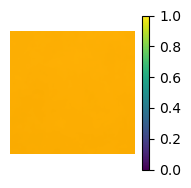

In [11]:
dist_mean = torch.concatenate(train_sets) .mean(0)
plot_single_im(dist_mean, colorbar=True)
print(dist_mean.mean())
K = dist_mean.shape[2]
K

In [12]:
dist_mean.mean(dim = (1,2), keepdim = True) 

tensor([[[0.4980]],

        [[0.4419]],

        [[0.3198]]])

# Synthesis

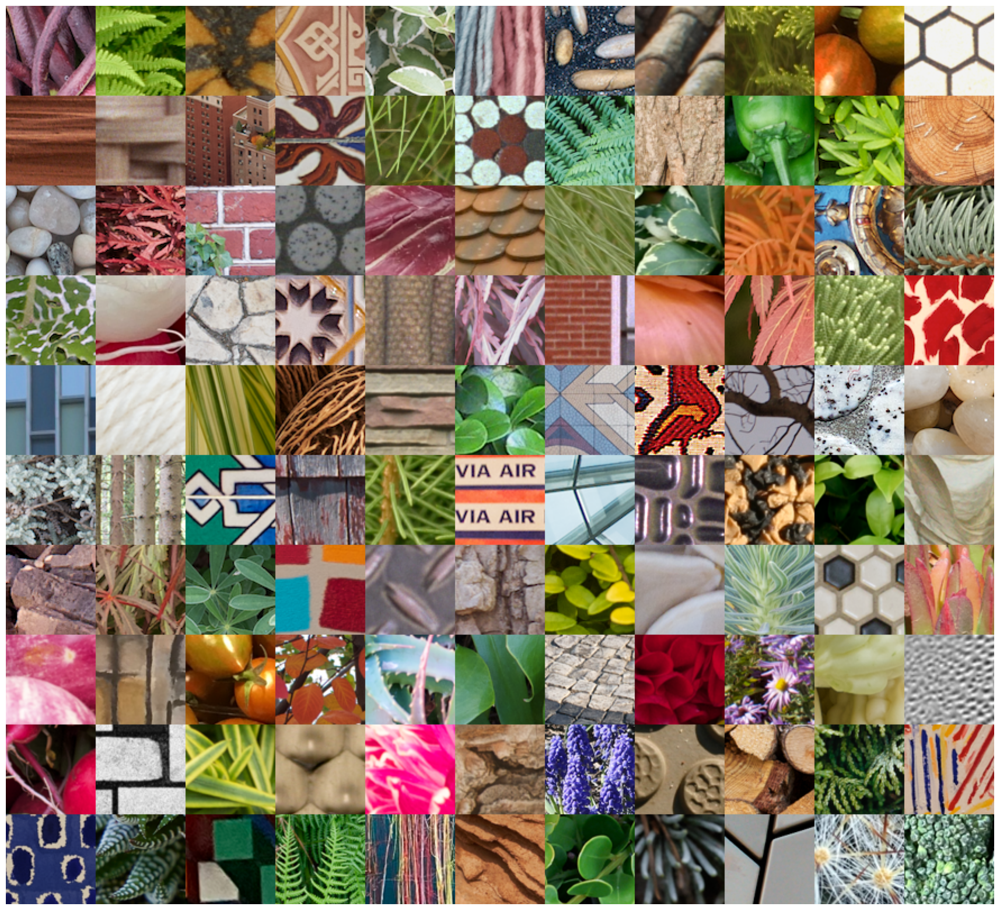

In [13]:
my_ids =  [4,7, 14,16, 20,24, 37, 41,67, 74, 96, 110, 121, 132, 144,151, 192, 199, 200,
                      233,246,248, 260, 271,343, 345, 350, 366, 374, 413, 415, 416, 439, 457, 
                     460, 492,516,520, 526,560, 597,617, 626,628, 629, 638,652,659, 665,682,
                     691, 697, 722,733,735,742, 753,754, 763, 764, 765, 778, 786, 802,805, 806, 814, 817,828, 
                     831, 843, 846,869,872, 902, 934,937,940,946, 974,977, 970,983, 1000 , 1015, 1040,1069,
                     1073,1077,1109, 1150, 1181,1193, 1261, 1298, 1321, 1412, 1415, 1455,1461,1464,1478, 1518,1532, 
                    1551,1577,1590, 1629, 1680, 1681]

my_ims =torch.concatenate([train_sets[id][77:78] for id in my_ids])
# show_im_set(my_ims, n_columns=11, sub_labels = my_ids)
show_im_grid(my_ims, n_columns=11)


# samples from backward algorithm

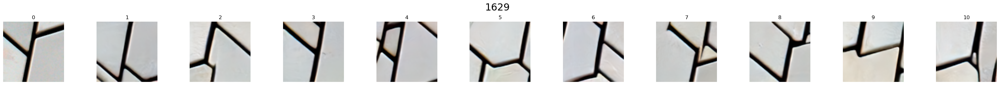

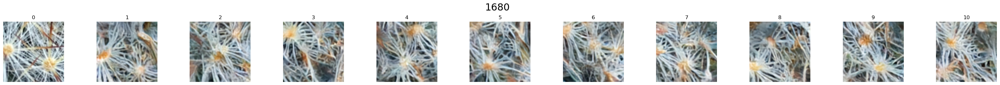

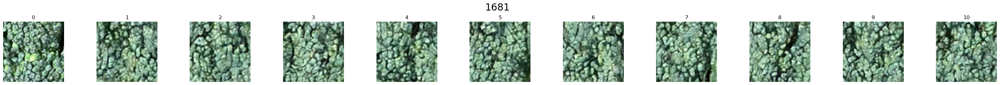

In [60]:
metamers1 = torch.load('../results/metamer_samples_80x80_mixture-color-no-skip-deep_texture_sig_1.pt', weights_only= True)
metamers05 = torch.load('../results/metamer_samples_80x80_mixture-color-no-skip-deep_texture_sig_0.5.pt', weights_only= True)
metamers01 = torch.load('../results/metamer_samples_80x80_mixture-color-no-skip-deep_texture_sig_0.1.pt', weights_only= True)
metamers_range20 = torch.load('../results/metamer_samples_80x80_mixture-color-no-skip-deep_texture_linspace20.pt', weights_only= True)
metamers_range50 = torch.load('../results/metamer_samples_80x80_mixture-color-no-skip-deep_texture_sig__linspace50.pt', weights_only= True)
metamers_range100 = torch.load('../results/metamer_samples_80x80_mixture-color-no-skip-deep_texture_sig__linspace100.pt', weights_only= True)

for key, im in metamers_range20.items(): 
    if key > 1600 and key < 20000:
        show_im_set(torch.concatenate( [train_sets[key][77:78].cuda(), torch.clip(metamers_range20[key],0,1)] ) ,label=key, n_columns=11)                
        # show_im_set(torch.concatenate( [train_sets[key][77:78].cuda(), torch.clip(metamers_range50[key],0,1)] ) , n_columns=11)                
        
        # show_im_set(torch.concatenate( [torch.ones_like(my_ims[0:1], device=device), torch.clip(metamers1[key],0,1)] ) , n_columns=11)
        # show_im_set(torch.concatenate( [torch.ones_like(my_ims[0:1], device=device), torch.clip(metamers05[key],0,1)] ) , n_columns=11)       
        # show_im_set(torch.concatenate( [torch.ones_like(my_ims[0:1], device=device), torch.clip(metamers01[key],0,1)] ) , n_columns=11)        


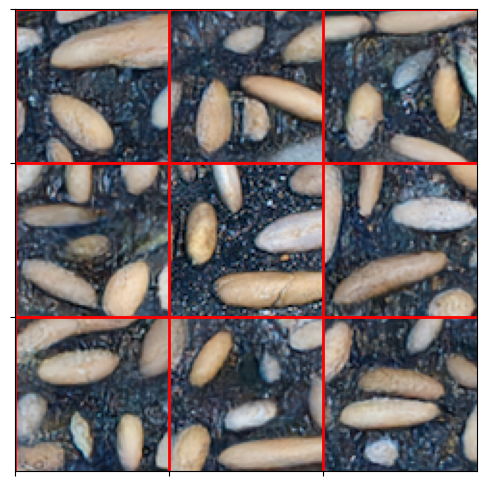

In [134]:
key =  37
show_im_grid(torch.cat(( torch.clip(metamers_range20[key][0:4],0,1).cpu()  , train_sets[key][77:78], torch.clip(metamers_range20[key][4:8],0,1).cpu() ) ),
             n_columns=3, grid_lines=True, save_name = '../results/metamors_texture_key_' +str(key)+'.png'
            , dpi = 50);

# Condtion on multiple images from the same class 

In [37]:
c = my_ids[22]
n_samples = 10
K = 80
x_c = train_sets[c][0:10]

metamors = backward_sampling(model=denoisers[group], 
                  x = dist_mean.mean(dim = (1,2), keepdim = True)  * torch.ones(n_samples,3,K,K), 
                  x_c = x_c,
                  sigmas= torch.linspace(1,0.05, 20), 
                  sig_c=None, 
                  max_iter=100, 
                  seed=None, 
                  K=None , 
                  average_phi=True)

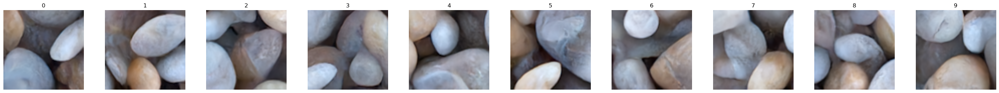

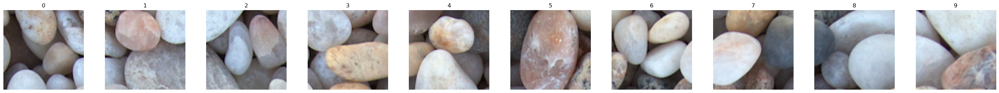

260


In [41]:
show_im_set(torch.clip(metamors[0], 0,1), n_columns=10)
show_im_set(x_c )
print(c)

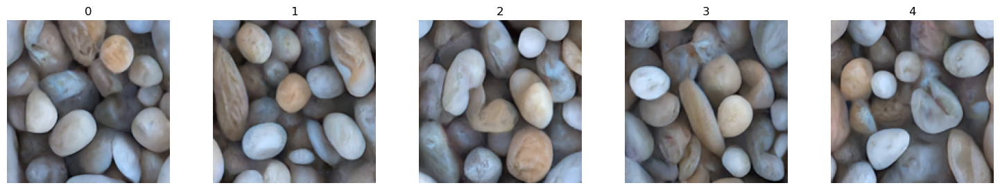

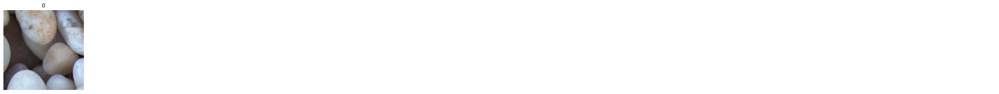

260


In [36]:
show_im_set(torch.clip(metamors[0], 0,1), n_columns=5)
show_im_set(x_c )
print(c)

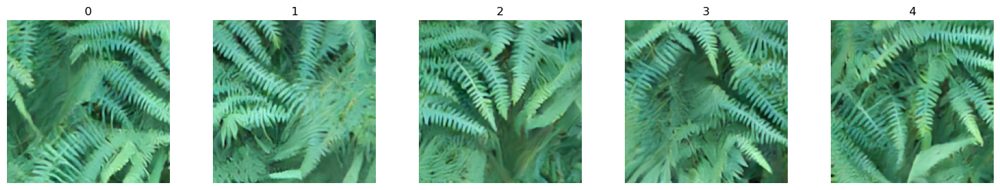

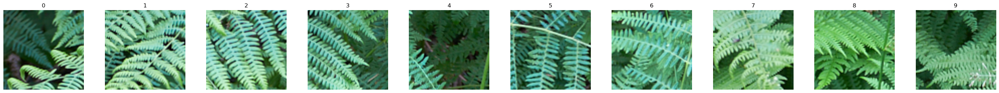

In [924]:
show_im_set(torch.clip(metamors[0], 0,1), n_columns=5)
show_im_set(train_sets[c][0::14]) 

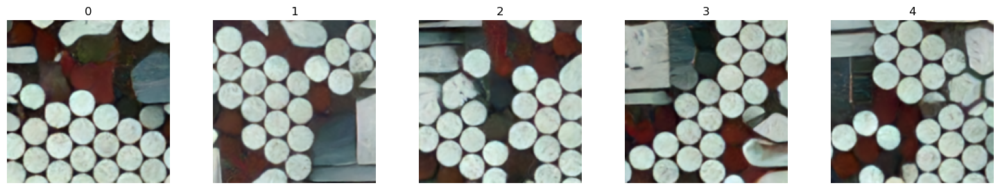

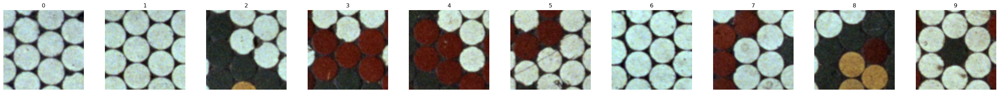

In [922]:
show_im_set(torch.clip(metamors[0], 0,1), n_columns=5)
show_im_set(train_sets[c][0::14]) 

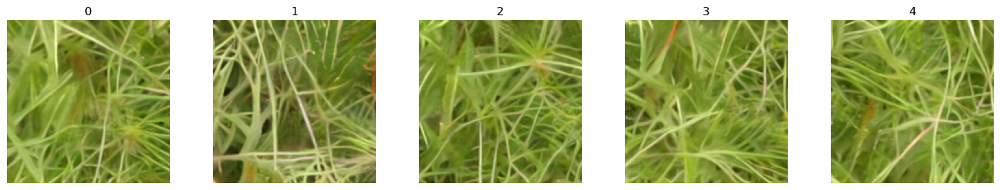

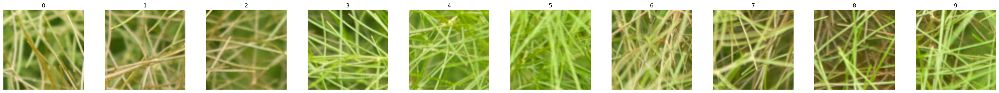

In [920]:
show_im_set(torch.clip(metamors[0], 0,1), n_columns=5)
show_im_set(train_sets[c][0::14]) 

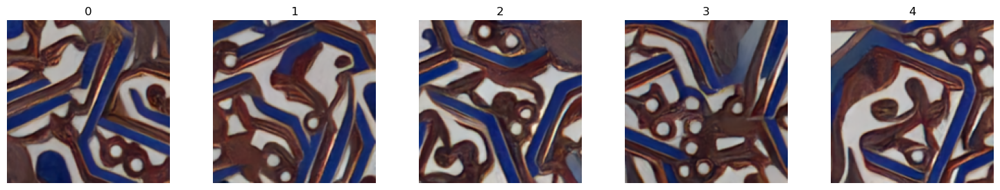

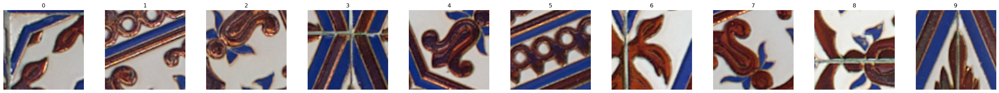

In [918]:
show_im_set(torch.clip(metamors[0], 0,1), n_columns=5)
show_im_set(train_sets[c][0::14]) 

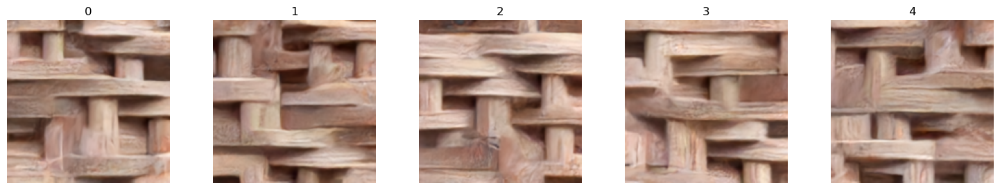

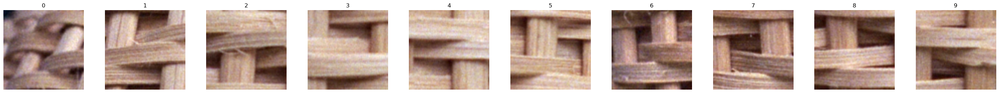

In [914]:
show_im_set(torch.clip(metamors[0], 0,1), n_columns=5)
show_im_set(train_sets[c][0::14]) 